<a href="https://colab.research.google.com/github/desmond-lartey/Knowledge-Management-Informatics/blob/Fires/docs/examples/train_segmentation_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
from google.colab import drive
drive.mount('/content/drive')

ValueError: Mountpoint must not already contain files

In [ ]:

import os
os.chdir('/content/drive/MyDrive/planner')
print(f"Current working directory: {os.getcwd()}")

Current working directory: /content/drive/MyDrive/planner


In [ ]:
import os
print(os.listdir())

['train_segmentation_model.ipynb', 'geoai_diagnostics']


# Train a Semantic Segmentation Model using Segmentation-Models-PyTorch

[![image](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeos/geoai/blob/main/docs/examples/train_segmentation_model.ipynb)

This notebook demonstrates how to train semantic segmentation models for object detection (e.g., building detection) using the [segmentation-models-pytorch](https://smp.readthedocs.io) library. Unlike instance segmentation with Mask R-CNN, this approach treats the task as pixel-level binary classification.

## Install packages
To use the new functionality, ensure the required packages are installed.


In [2]:
 %pip install geoai-py

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.0/281.0 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.0/631.0 kB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.5/122.5 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 122.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 70.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 82.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 119.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.0/605.0 kB 51.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Import libraries

In [3]:
import geoai

## Download sample data

We'll use the same dataset as the Mask R-CNN example for consistency.

In [ ]:
train_raster_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_rgb_train.tif"
)
train_vector_url = "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_train_buildings.geojson"
test_raster_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_test.tif"
)

In [ ]:
train_raster_path = geoai.download_file(train_raster_url)
train_vector_path = geoai.download_file(train_vector_url)
test_raster_path = geoai.download_file(test_raster_url)

## Visualize sample data

In [ ]:
geoai.get_raster_info(train_raster_path)

{'driver': 'GTiff',
 'width': 2503,
 'height': 1126,
 'count': 3,
 'dtype': 'uint8',
 'crs': 'EPSG:26911',
 'transform': Affine(0.6000000000000046, 0.0, 454780.8,
        0.0, -0.6, 5278242.6),
 'bounds': BoundingBox(left=454780.8, bottom=5277567.0, right=456282.6, top=5278242.6),
 'resolution': (0.6000000000000046, 0.6),
 'nodata': None,
 'band_stats': [{'band': 1,
   'min': 12.0,
   'max': 251.0,
   'mean': 150.6730747259594,
   'std': 48.01908734374099},
  {'band': 2,
   'min': 49.0,
   'max': 251.0,
   'mean': 141.92468895229808,
   'std': 43.46595463573497},
  {'band': 3,
   'min': 53.0,
   'max': 251.0,
   'mean': 120.89909373405554,
   'std': 41.78086244480775}]}

In [ ]:
geoai.view_vector_interactive(train_vector_path, tiles=train_raster_path)

In [ ]:
geoai.view_raster(test_raster_path)

Map(center=[47.6464835, -117.59043650000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

## Create training data

We'll create the same training tiles as before.

In [ ]:
out_folder = "buildings"
tiles = geoai.export_geotiff_tiles(
    in_raster=train_raster_path,
    out_folder=out_folder,
    in_class_data=train_vector_path,
    tile_size=512,
    stride=256,
    buffer_radius=0,
)


Raster info for naip_rgb_train.tif:
  CRS: EPSG:26911
  Dimensions: 2503 x 1126
  Resolution: (0.6000000000000046, 0.6)
  Bands: 3
  Bounds: BoundingBox(left=454780.8, bottom=5277567.0, right=456282.6, top=5278242.6)
Loaded 735 features from naip_train_buildings.geojson
Vector CRS: EPSG:4326
Reprojecting features from EPSG:4326 to EPSG:26911
Found 1 unique classes: ['building']


Generated: 36, With features: 36: 100%|██████████| 36/36 [00:10<00:00,  3.31it/s]


------- Export Summary -------
Total tiles exported: 36
Tiles with features: 36 (100.0%)
Average feature pixels per tile: 46795.0
Output saved to: buildings

------- Georeference Verification -------


## Train semantic segmentation model

Now we'll train a semantic segmentation model using the new `train_segmentation_model` function. This function supports various architectures from `segmentation-models-pytorch`:

- **Architectures**: `unet`, `unetplusplus` `deeplabv3`, `deeplabv3plus`, `fpn`, `pspnet`, `linknet`, `manet`
- **Encoders**: `resnet34`, `resnet50`, `efficientnet-b0`, `mobilenet_v2`, etc.

For more details, please refer to the [segmentation-models-pytorch documentation](https://smp.readthedocs.io/en/latest/models.html).

### Example 1: U-Net with ResNet34 encoder


In [ ]:
# Train U-Net model
geoai.train_segmentation_model(
    images_dir=f"{out_folder}/images",
    labels_dir=f"{out_folder}/labels",
    output_dir=f"{out_folder}/unet_models",
    architecture="unet",
    encoder_name="resnet34",
    encoder_weights="imagenet",
    num_channels=3,
    num_classes=2,  # background and building
    batch_size=8,
    num_epochs=5,
    learning_rate=0.001,
    val_split=0.2,
    verbose=True,
)

Using device: cuda
Found 36 image files and 36 label files
Training on 28 images, validating on 8 images
Checking image sizes for compatibility...
All sampled images have the same size: (512, 512)
No resizing needed.
Testing data loader...
Data loader test passed.


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

Starting training with unet + resnet34
Model parameters: 24,436,514
Epoch: 1, Batch: 1/4, Loss: 0.5932, Time: 3.81s
Epoch 1/5: Train Loss: 0.4549, Val Loss: 0.6711, Val IoU: 0.4231, Val F1: 0.4705, Val Precision: 0.5403, Val Recall: 0.5044
Saving best model with IoU: 0.4231
Epoch: 2, Batch: 1/4, Loss: 0.3020, Time: 1.28s
Epoch 2/5: Train Loss: 0.2594, Val Loss: 3.5186, Val IoU: 0.4270, Val F1: 0.4735, Val Precision: 0.6817, Val Recall: 0.5085
Saving best model with IoU: 0.4270
Epoch: 3, Batch: 1/4, Loss: 0.1966, Time: 1.56s
Epoch 3/5: Train Loss: 0.1697, Val Loss: 2.4491, Val IoU: 0.4441, Val F1: 0.5018, Val Precision: 0.8370, Val Recall: 0.5237
Saving best model with IoU: 0.4441
Epoch: 4, Batch: 1/4, Loss: 0.1370, Time: 1.31s
Epoch 4/5: Train Loss: 0.1422, Val Loss: 3.6334, Val IoU: 0.5679, Val F1: 0.6705, Val Precision: 0.8663, Val Recall: 0.6370
Saving best model with IoU: 0.5679
Epoch: 5, Batch: 1/4, Loss: 0.1181, Time: 1.90s
Epoch 5/5: Train Loss: 0.1164, Val Loss: 1.4208, Val IoU

### Example 2: SegFormer with resnet152 encoder

In [ ]:
geoai.train_segmentation_model(
    images_dir=f"{out_folder}/images",
    labels_dir=f"{out_folder}/labels",
    output_dir=f"{out_folder}/segformer_models",
    architecture="segformer",
    encoder_name="resnet152",
    encoder_weights="imagenet",
    num_channels=3,
    num_classes=2,
    batch_size=6,  # Smaller batch size for more complex model
    num_epochs=5,
    learning_rate=0.0005,
    val_split=0.2,
)

Using device: cuda
Found 36 image files and 36 label files
Training on 28 images, validating on 8 images
Checking image sizes for compatibility...
All sampled images have the same size: (512, 512)
No resizing needed.
Testing data loader...
Data loader test passed.


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/241M [00:00<?, ?B/s]

Starting training with segformer + resnet152
Model parameters: 59,473,218
Epoch: 1, Batch: 1/5, Loss: 0.7512, Time: 2.06s
Epoch 1/5: Train Loss: 0.6021, Val Loss: 0.8794, Val IoU: 0.4910, Val F1: 0.6235, Val Precision: 0.6418, Val Recall: 0.6723
Saving best model with IoU: 0.4910
Epoch: 2, Batch: 1/5, Loss: 0.3874, Time: 2.27s
Epoch 2/5: Train Loss: 0.2957, Val Loss: 0.3264, Val IoU: 0.5393, Val F1: 0.6457, Val Precision: 0.7444, Val Recall: 0.6220
Saving best model with IoU: 0.5393
Epoch: 3, Batch: 1/5, Loss: 0.2150, Time: 2.06s
Epoch 3/5: Train Loss: 0.1954, Val Loss: 0.2589, Val IoU: 0.6469, Val F1: 0.7606, Val Precision: 0.8219, Val Recall: 0.7361
Saving best model with IoU: 0.6469
Epoch: 4, Batch: 1/5, Loss: 0.1791, Time: 2.62s
Epoch 4/5: Train Loss: 0.1506, Val Loss: 0.1711, Val IoU: 0.7604, Val F1: 0.8543, Val Precision: 0.8852, Val Recall: 0.8331
Saving best model with IoU: 0.7604
Epoch: 5, Batch: 1/5, Loss: 0.1264, Time: 2.71s
Epoch 5/5: Train Loss: 0.1328, Val Loss: 0.1526, V

## Run inference

Now we'll use the trained model to make predictions on the test image.

In [ ]:
# Define paths
masks_path = "naip_test_semantic_prediction.tif"
model_path = f"{out_folder}/unet_models/best_model.pth"

In [ ]:
# Run semantic segmentation inference
geoai.semantic_segmentation(
    input_path=test_raster_path,
    output_path=masks_path,
    model_path=model_path,
    architecture="unet",
    encoder_name="resnet34",
    num_channels=3,
    num_classes=2,
    window_size=512,
    overlap=256,
    batch_size=4,
)

Input file format: GeoTIFF (.tif)
Processing 65 windows...


84it [00:02, 38.21it/s]


Predicted classes: 2 classes, Background: 91.3%
Inference completed in 2.86 seconds
Saved prediction to naip_test_semantic_prediction.tif


## Output probability map (optional)

You can also output the probability map by providing the `probability_path` parameter. This will save a multi-band raster where each band represents the probability for each class (0-1 range).

In [ ]:
# Run inference with probability output
probability_path = "naip_test_probability_map.tif"

geoai.semantic_segmentation(
    input_path=test_raster_path,
    output_path=masks_path,
    model_path=model_path,
    architecture="unet",
    encoder_name="resnet34",
    num_channels=3,
    num_classes=2,
    window_size=512,
    overlap=256,
    batch_size=4,
    probability_path=probability_path,  # Output probability map
)

Input file format: GeoTIFF (.tif)
Processing 65 windows...


84it [00:02, 39.94it/s]


Predicted classes: 2 classes, Background: 91.3%
Inference completed in 2.70 seconds
Saved prediction to naip_test_semantic_prediction.tif
Saved probability map to naip_test_probability_map.tif


In [ ]:
# Visualize probability map for building class (band 2)
geoai.view_raster(
    probability_path, indexes=[2], basemap=test_raster_path, backend="ipyleaflet"
)

Map(center=[47.6464835, -117.59043650000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

You can also control the classification threshold for binary segmentation. By default, argmax is used, but you can specify a custom threshold:

In [ ]:
# Run inference with custom probability threshold
masks_path_threshold = "naip_test_semantic_prediction_threshold2.tif"

geoai.semantic_segmentation(
    input_path=test_raster_path,
    output_path=masks_path_threshold,
    model_path=model_path,
    architecture="unet",
    encoder_name="resnet34",
    num_channels=3,
    num_classes=2,
    window_size=512,
    overlap=256,
    batch_size=4,
    probability_threshold=0.3,  # Only classify as building if probability >= 0.7
)

Input file format: GeoTIFF (.tif)
Processing 65 windows...


84it [00:02, 36.43it/s]


Using probability threshold: 0.3
Predicted classes: 2 classes, Background: 88.6%
Inference completed in 2.94 seconds
Saved prediction to naip_test_semantic_prediction_threshold2.tif


## Vectorize masks

Convert the predicted mask to vector format for better visualization and analysis.

In [ ]:
output_vector_path = "naip_test_semantic_prediction.geojson"
gdf = geoai.orthogonalize(masks_path, output_vector_path, epsilon=2)

Processing 977 features...


Converting features: 100%|██████████| 977/977 [00:10<00:00, 91.28shape/s]


Saving to naip_test_semantic_prediction.geojson...
Done!


## Add geometric properties

In [ ]:
gdf_props = geoai.add_geometric_properties(gdf, area_unit="m2", length_unit="m")

## Visualize results

In [ ]:
geoai.view_raster(masks_path, nodata=0, basemap=test_raster_path, backend="ipyleaflet")

Map(center=[47.6464835, -117.59043650000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [ ]:
geoai.view_vector_interactive(gdf_props, column="area_m2", tiles=test_raster_path)

In [ ]:
gdf_filtered = gdf_props[(gdf_props["area_m2"] > 50)]

In [ ]:
geoai.view_vector_interactive(gdf_filtered, column="area_m2", tiles=test_raster_path)

In [ ]:
geoai.create_split_map(
    left_layer=gdf_filtered,
    right_layer=test_raster_path,
    left_args={"style": {"color": "red", "fillOpacity": 0.2}},
    basemap=test_raster_path,
)

Map(center=[47.6464835, -117.59043650000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

## Model Performance Analysis

Let's examine the training curves and model performance:

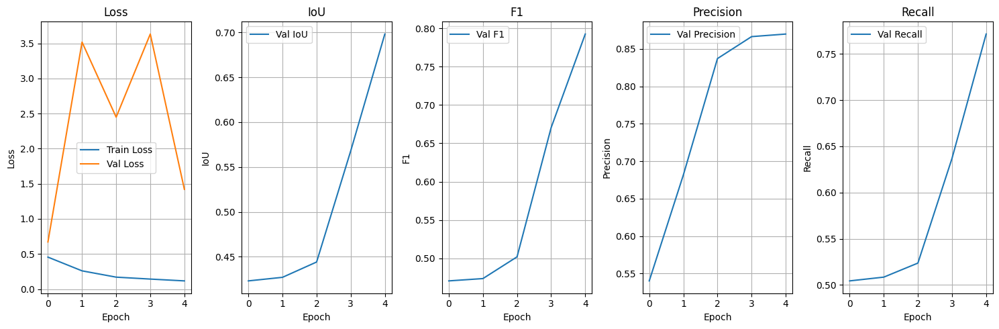


=== Performance Metrics Summary ===
IoU     - Best: 0.6981 | Final: 0.6981
F1      - Best: 0.7926 | Final: 0.7926
Precision - Best: 0.8697 | Final: 0.8697
Recall  - Best: 0.7714 | Final: 0.7714
Val Loss - Best: 0.6711 | Final: 1.4208



,epoch,train_loss,val_loss,val_iou,val_f1,val_precision,val_recall
0,1,0.454930,0.671059,0.423072,0.470482,0.540253,0.504401
1,2,0.259371,3.518580,0.427039,0.473495,0.681666,0.508468
2,3,0.169684,2.449113,0.444097,0.501837,0.836993,0.523665
3,4,0.142229,3.633370,0.567903,0.670476,0.866289,0.637021
4,5,0.116359,1.420751,0.698122,0.792564,0.869714,0.771448


In [ ]:
geoai.plot_performance_metrics(
    history_path=f"{out_folder}/unet_models/training_history.pth",
    figsize=(15, 5),
    verbose=True,
)

![image](https://github.com/user-attachments/assets/9355446f-f9ba-4818-aedb-4bb5dee56813)

## Performance Metrics

**IoU (Intersection over Union)** and **Dice score** are both popular metrics used to evaluate the similarity between two binary masks—often in image segmentation tasks. While they are related, they are not the same.

---

### 🔸 **Definitions**

#### **IoU (Jaccard Index)**

$$
\text{IoU} = \frac{|A \cap B|}{|A \cup B|}
$$

* Measures the overlap between predicted region $A$ and ground truth region $B$ relative to their union.
* Ranges from 0 (no overlap) to 1 (perfect overlap).

#### **Dice Score (F1 Score for Sets)**

$$
\text{Dice} = \frac{2|A \cap B|}{|A| + |B|}
$$

* Measures the overlap between $A$ and $B$, but gives more weight to the intersection.
* Also ranges from 0 to 1.

---

### 🔸 **Key Differences**

| Metric   | Formula                     | Penalizes                      | Sensitivity                      |
| -------- | --------------------------- | ------------------------------ | -------------------------------- |
| **IoU**  | $\frac{TP}{TP + FP + FN}$   | FP and FN equally              | Less sensitive to small objects  |
| **Dice** | $\frac{2TP}{2TP + FP + FN}$ | Less harsh on small mismatches | More sensitive to small overlaps |

> TP: True Positive, FP: False Positive, FN: False Negative

---

### 🔸 **Relationship**

Dice and IoU are mathematically related:

$$
\text{Dice} = \frac{2 \cdot \text{IoU}}{1 + \text{IoU}} \quad \text{or} \quad \text{IoU} = \frac{\text{Dice}}{2 - \text{Dice}}
$$

---

### 🔸 **When to Use What**

* **IoU**: Common in object detection and semantic segmentation benchmarks (e.g., COCO, Pascal VOC).
* **Dice**: Preferred in medical imaging and when class imbalance is an issue, due to its sensitivity to small regions.

In [ ]:
import numpy as np
import geopandas as gpd
import pandas as pd
import rasterio, rasterio.mask
from shapely.geometry import box
from pathlib import Path

# --- paths (edit if needed)
TEST_RASTER = "naip_test.tif"                          # NAIP, 4 bands [R,G,B,NIR]
PRED_VECTOR = "naip_test_semantic_prediction.geojson"  # from your vectorize step
OUT_DIR = Path("geoai_diagnostics")
OUT_DIR.mkdir(exist_ok=True)


In [ ]:
# Load predicted polygons
bld = gpd.read_file(PRED_VECTOR)
if "area_m2" not in bld.columns:
    bld["area_m2"] = bld.geometry.area

# Optional: filter tiny artifacts (keep your threshold if you already did)
bld = bld[bld["area_m2"] > 50].copy()
bld = bld.reset_index(drop=True)
print(f"Predicted buildings kept: {len(bld)}")


Predicted buildings kept: 616


In [ ]:
CELL_M = 200  # grid cell size in meters (tunable)

with rasterio.open(TEST_RASTER) as src:
    crs = src.crs
    bounds = src.bounds

xmin, ymin, xmax, ymax = bounds.left, bounds.bottom, bounds.right, bounds.top
xs = np.arange(xmin, xmax, CELL_M)
ys = np.arange(ymin, ymax, CELL_M)

cells = [box(x0, y0, x0 + CELL_M, y0 + CELL_M) for x0 in xs for y0 in ys]
grid = gpd.GeoDataFrame({"cell_id": range(len(cells))}, geometry=cells, crs=crs)
grid_area_m2 = CELL_M * CELL_M
grid.head()


,cell_id,geometry
0,0,"POLYGON ((454841.6 5276774.4, 454841.6 5276974..."
1,1,"POLYGON ((454841.6 5276974.4, 454841.6 5277174..."
2,2,"POLYGON ((454841.6 5277174.4, 454841.6 5277374..."
3,3,"POLYGON ((454841.6 5277374.4, 454841.6 5277574..."
4,4,"POLYGON ((454841.6 5277574.4, 454841.6 5277774..."


In [ ]:
def ndvi_mean_for_geom(geom):
    with rasterio.open(TEST_RASTER) as src:
        try:
            out, _ = rasterio.mask.mask(src, [geom.__geo_interface__], crop=True)
            # NAIP typical order: [R,G,B,NIR]
            R = out[0].astype(np.float32)
            N = out[3].astype(np.float32)
            mask = (R + N) > 0
            if mask.sum() == 0:
                return np.nan
            ndvi = (N - R) / (N + R + 1e-6)
            return float(np.nanmean(np.where(mask, ndvi, np.nan)))
        except Exception:
            return np.nan

ndvi_vals = [ndvi_mean_for_geom(g) for g in grid.geometry]
grid["ndvi_mean"] = ndvi_vals
# quick “green ratio” proxy: 1 if a cell is generally green, else 0 (tune threshold)
grid["green_flag"] = (grid["ndvi_mean"] > 0.3).astype(float)


In [ ]:
# Spatial join for count and size stats
sj = gpd.sjoin(bld[["geometry","area_m2"]], grid[["cell_id","geometry"]], predicate="intersects")
agg = sj.groupby("cell_id").agg(
    bld_count=("area_m2", "size"),
    bld_area_sum=("area_m2", "sum"),
    mean_bld_area=("area_m2", "mean"),
    med_bld_area=("area_m2", "median")
)

grid = grid.join(agg, on="cell_id")
grid[["bld_count","bld_area_sum","mean_bld_area","med_bld_area"]] = \
    grid[["bld_count","bld_area_sum","mean_bld_area","med_bld_area"]].fillna(0)

grid["bld_coverage"] = grid["bld_area_sum"] / grid_area_m2  # fraction of cell covered by buildings

# Optional compactness/fragmentation proxy: many small buildings → fragmented fabric
grid["pct_small_structures"] = 0.0
if len(sj) > 0:
    small = sj[sj["area_m2"] < 60].groupby("cell_id").size()
    grid.loc[small.index, "pct_small_structures"] = (small / grid["bld_count"]).fillna(0).loc[small.index]


In [ ]:
def minmax(s):
    if np.nanmax(s) == np.nanmin(s):
        return s*0
    return (s - np.nanmin(s)) / (np.nanmax(s) - np.nanmin(s))

# helpers, normalized
grid["_n_bld"]     = minmax(grid["bld_count"])
grid["_small"]     = minmax(grid["pct_small_structures"])
grid["_cov"]       = minmax(grid["bld_coverage"])
grid["_inv_ndvi"]  = 1 - minmax(grid["ndvi_mean"].fillna(0))

# Sprawl score: many buildings, many small ones, moderate/low coverage (leapfrog/fragmentation)
grid["sprawl_score"] = (0.45*grid["_n_bld"] + 0.45*grid["_small"] + 0.10*(1 - grid["_cov"])).clip(0,1)

# Environmental degradation: low NDVI + high building coverage (as an impervious proxy)
grid["envdeg_score"] = (0.6*grid["_inv_ndvi"] + 0.4*grid["_cov"]).clip(0,1)


In [ ]:
def recommend(row):
    recs = []

    # Sprawl + low greenness → consolidation + green protection
    if row["sprawl_score"] >= 0.6 and row["ndvi_mean"] < 0.3:
        recs += [
            "Infill & gentle densification near services (form-based code).",
            "Protect peri-urban green wedges; set urban growth boundaries.",
            "Complete sidewalks + crossings; create mixed-use nodes."
        ]
    elif row["sprawl_score"] >= 0.6:
        recs += [
            "Cluster development; curb leapfrog subdivisions.",
            "Improve block connectivity; add missing street links."
        ]

    # Environmental degradation → blue-green retrofits
    if row["envdeg_score"] >= 0.6 and row["ndvi_mean"] < 0.3:
        recs += [
            "Street-tree program & pocket parks for cooling and amenity.",
            "Bioswales / rain gardens; permeable parking retrofits.",
            "Prioritize grey-to-green conversions on public land."
        ]

    # Always suggest low-regret monitoring where signals are mild
    if not recs:
        return "Monitor; no immediate action (track NDVI and coverage quarterly)."
    # de-duplicate while keeping order
    seen, out = set(), []
    for r in recs:
        if r not in seen:
            out.append(r); seen.add(r)
    return "; ".join(out)

grid["recommendations"] = grid.apply(recommend, axis=1)


In [ ]:
gj = OUT_DIR / "urban_diagnostics.geojson"
csv = OUT_DIR / "urban_diagnostics.csv"

cols = ["cell_id","sprawl_score","envdeg_score","bld_count","bld_coverage",
        "mean_bld_area","med_bld_area","pct_small_structures","ndvi_mean","recommendations"]

grid.to_file(gj, driver="GeoJSON")
grid[cols].to_csv(csv, index=False)

print(" Exports written:")
print(" •", gj)
print(" •", csv)


 Exports written:
 • geoai_diagnostics/urban_diagnostics.geojson
 • geoai_diagnostics/urban_diagnostics.csv


In [ ]:
import leafmap
m = leafmap.Map()
m.add_raster(TEST_RASTER, layer_name="NAIP")
m.add_geojson(str(OUT_DIR/"urban_diagnostics.geojson"), layer_name="Diagnostics grid")
m


Map(center=[47.6464835, -117.59043650000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [ ]:
pip install osmnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.5/101.5 kB 990.1 kB/s eta 0:00:00


In [ ]:
import os
print(os.getcwd())        # Shows your current folder
print(os.listdir())       # Lists all files in it


/content/drive/MyDrive/planner
['train_segmentation_model.ipynb', 'geoai_diagnostics', 'naip_rgb_train.tif', 'naip_train_buildings.geojson', 'naip_test.tif', 'buildings', 'naip_test_semantic_prediction.tif', 'naip_test_probability_map.tif', 'naip_test_semantic_prediction_threshold2.tif', 'naip_test_semantic_prediction.geojson']


In [ ]:
import osmnx as ox
import rasterio
import geopandas as gpd
from shapely.geometry import box

print(" Using OSMnx version:", ox.__version__)

# --- Load raster and get bounds ---
TEST_RASTER = "/content/drive/MyDrive/planner/naip_test.tif"

with rasterio.open(TEST_RASTER) as src:
    bounds = src.bounds
    crs = src.crs

print(f"Raster CRS: {crs}")

# Create a bounding box polygon in the raster's CRS
bbox_geom = box(bounds.left, bounds.bottom, bounds.right, bounds.top)
gdf_bbox = gpd.GeoDataFrame(geometry=[bbox_geom], crs=crs)

#  Reproject to EPSG:4326 (WGS84)
gdf_bbox = gdf_bbox.to_crs(epsg=4326)
lon_min, lat_min, lon_max, lat_max = gdf_bbox.total_bounds

print(f"Reprojected bbox (lat/lon): {lat_min}, {lat_max}, {lon_min}, {lon_max}")

# --- Use OSMnx with corrected coordinates ---
from osmnx.graph import graph_from_bbox
from osmnx import graph_to_gdfs

# graph_from_bbox expects (north, south, east, west)
bbox = (lat_max, lat_min, lon_max, lon_min)
G = graph_from_bbox(bbox=bbox, network_type="drive")

# Convert to GeoDataFrames
edges, nodes = graph_to_gdfs(G)

print(f" Downloaded {len(edges)} road segments and {len(nodes)} intersections")


 Using OSMnx version: 2.0.6
Raster CRS: EPSG:26911
Reprojected bbox (lat/lon): 47.64277828744407, 47.650188919438484, -117.6039857669145, -117.57688661080043
 Downloaded 3 road segments and 2 intersections


In [ ]:
pip install rasterstats

In [ ]:
import geopandas as gpd
import rasterio
import numpy as np
import pandas as pd
from rasterstats import zonal_stats
from shapely.geometry import box

# --- Define raster and road data ---
SEGMENTATION_RASTER = "/content/drive/MyDrive/planner/naip_test_semantic_prediction.tif"

# Create a uniform analysis grid over your raster
with rasterio.open(SEGMENTATION_RASTER) as src:
    bounds = src.bounds
    transform = src.transform
    res = src.res[0] * 50  # grid ~50× pixel spacing (~50x50 m if 1m resolution)

xmin, ymin, xmax, ymax = bounds.left, bounds.bottom, bounds.right, bounds.top

grid_cells = []
for x0 in np.arange(xmin, xmax, res):
    for y0 in np.arange(ymin, ymax, res):
        x1 = x0 + res
        y1 = y0 + res
        grid_cells.append(box(x0, y0, x1, y1))
grid = gpd.GeoDataFrame(geometry=grid_cells, crs=src.crs)

# --- Building coverage proxy (from segmentation) ---
# assuming building class = 1, vegetation = 2, road = 3
with rasterio.open(SEGMENTATION_RASTER) as src:
    seg = src.read(1)

def ratio_mask(array, class_id):
    return np.count_nonzero(array == class_id) / array.size if array.size > 0 else 0

stats = []
for geom in grid.geometry:
    try:
        out_image, out_transform = rasterio.mask.mask(src, [geom], crop=True)
        arr = out_image[0]
        stats.append({
            "bld_coverage": ratio_mask(arr, 1),
            "veg_coverage": ratio_mask(arr, 2)
        })
    except:
        stats.append({"bld_coverage": 0, "veg_coverage": 0})

grid = pd.concat([grid, pd.DataFrame(stats)], axis=1)

# --- Compute road density ---
edges = edges.to_crs(grid.crs)
grid["road_density_km_per_km2"] = grid.geometry.apply(
    lambda g: edges.clip(g).length.sum() / 1000 / (g.area / 1e6)
)

# --- Derive proxy indicators ---
def minmax(x):
    return (x - x.min()) / (x.max() - x.min() + 1e-9)

grid["greenness"] = minmax(grid["veg_coverage"])
grid["openness"] = 1 - grid["bld_coverage"]
grid["enclosure"] = grid["bld_coverage"]
grid["walkability"] = (minmax(grid["road_density_km_per_km2"]) * (1 - minmax(grid["enclosure"]))).clip(0,1)
grid["imageability"] = minmax(grid["bld_coverage"] ** 0.5)  # simple uniqueness proxy


In [ ]:
grid["PQI"] = (
    0.25 * grid["greenness"] +
    0.20 * grid["openness"] +
    0.20 * (1 - grid["enclosure"]) +
    0.20 * grid["walkability"] +
    0.15 * grid["imageability"]
).clip(0,1)


In [ ]:
# If you have existing sprawl/envdeg scores, combine them
if "sprawl_score" not in grid.columns:
    grid["sprawl_score"] = 1 - grid["PQI"]
if "envdeg_score" not in grid.columns:
    grid["envdeg_score"] = 1 - grid["greenness"]

grid["infra_deficiency"] = (1 - minmax(grid["road_density_km_per_km2"])) * (1 - grid["walkability"])
grid["combined_risk"] = (0.4*grid["sprawl_score"] + 0.3*grid["envdeg_score"] + 0.3*grid["infra_deficiency"]).clip(0,1)


In [ ]:
def recommend_v2(row):
    recs = []
    if row["combined_risk"] >= 0.6 and row["PQI"] < 0.4:
        recs += [
            "Prioritize green corridor development and canopy restoration.",
            "Retrofit streets for walkability and open sightlines.",
            "Add mixed-use nodes to enhance livability and reduce stress."
        ]
    elif row["infra_deficiency"] > 0.5:
        recs += [
            "Improve street connectivity and intersection density.",
            "Develop pedestrian and cycling infrastructure."
        ]
    elif row["envdeg_score"] > 0.6:
        recs += [
            "Expand green infrastructure (parks, riparian buffers).",
            "Encourage blue-green stormwater management solutions."
        ]
    if not recs:
        return "Monitor area; maintain current pattern."
    return "; ".join(dict.fromkeys(recs))

grid["recommendations_v2"] = grid.apply(recommend_v2, axis=1)


In [ ]:
import leafmap

geo_path = "/content/drive/MyDrive/planner/urban_perception_infra.geojson"
grid.to_file(geo_path, driver="GeoJSON")

m = leafmap.Map()
m.add_raster(TEST_RASTER, layer_name="NAIP Image")
m.add_geojson(geo_path, layer_name="Perceptual & Infra Diagnostics")
m


Map(center=[47.6464835, -117.59043650000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [ ]:
import geopandas as gpd
import rasterio, rasterio.mask
import numpy as np, pandas as pd
from shapely.geometry import box
from rasterstats import zonal_stats
import leafmap

# ---------- Configuration ----------
SEGMENTATION_RASTER = "/content/drive/MyDrive/planner/naip_test_semantic_prediction.tif"
OUT_GEOJSON = "/content/drive/MyDrive/planner/urban_perception_full.geojson"
OUT_GEOJSON_WGS84 = "/content/drive/MyDrive/planner/urban_perception_full_wgs84.geojson"
PIX_RES_FACTOR = 100   # each cell ~100× pixel size (tune for performance)

# ---------- Create analysis grid ----------
with rasterio.open(SEGMENTATION_RASTER) as src:
    bounds, res, crs = src.bounds, src.res[0], src.crs
    step = res * PIX_RES_FACTOR
    xmin, ymin, xmax, ymax = bounds.left, bounds.bottom, bounds.right, bounds.top

cells = [box(x, y, x+step, y+step)
         for x in np.arange(xmin, xmax, step)
         for y in np.arange(ymin, ymax, step)]
grid = gpd.GeoDataFrame(geometry=cells, crs=crs)

# ---------- Compute class ratios ----------
def class_ratio(array, cid):
    return np.count_nonzero(array == cid) / array.size if array.size > 0 else 0

stats = []
with rasterio.open(SEGMENTATION_RASTER) as src:
    for geom in grid.geometry:
        try:
            out, _ = rasterio.mask.mask(src, [geom], crop=True)
            arr = out[0]
            stats.append({
                "bld_coverage": class_ratio(arr, 1),
                "veg_coverage": class_ratio(arr, 2)
            })
        except Exception:
            stats.append({"bld_coverage": 0, "veg_coverage": 0})

grid = pd.concat([grid, pd.DataFrame(stats)], axis=1)

# ---------- Road density ----------
edges = edges.to_crs(grid.crs)
grid["road_density_km_per_km2"] = grid.geometry.apply(
    lambda g: edges.clip(g).length.sum()/1000/(g.area/1e6)
)

# ---------- Proxy indicators ----------
def minmax(x): return (x - x.min())/(x.max() - x.min() + 1e-9)

grid["greenness"] = minmax(grid["veg_coverage"])
grid["openness"] = 1 - grid["bld_coverage"]
grid["enclosure"] = grid["bld_coverage"]
grid["walkability"] = (minmax(grid["road_density_km_per_km2"]) *
                       (1 - minmax(grid["enclosure"]))).clip(0,1)
grid["imageability"] = minmax(np.sqrt(grid["bld_coverage"]))

# ---------- Perceptual Quality Index ----------
grid["PQI"] = (
    0.25*grid["greenness"] +
    0.20*grid["openness"] +
    0.20*(1 - grid["enclosure"]) +
    0.20*grid["walkability"] +
    0.15*grid["imageability"]
).clip(0,1)

# ---------- Composite risk ----------
grid["sprawl_score"] = 1 - grid["PQI"]
grid["envdeg_score"] = 1 - grid["greenness"]
grid["infra_deficiency"] = (1 - minmax(grid["road_density_km_per_km2"])) * (1 - grid["walkability"])
grid["combined_risk"] = (0.4*grid["sprawl_score"] +
                         0.3*grid["envdeg_score"] +
                         0.3*grid["infra_deficiency"]).clip(0,1)

# ---------- Management recommendations ----------
def recommend_v2(row):
    recs = []
    if row["combined_risk"] >= 0.6 and row["PQI"] < 0.4:
        recs += ["Green corridor & canopy restoration",
                 "Retrofit streets for walkability & sightlines",
                 "Add mixed-use nodes to enhance livability"]
    elif row["infra_deficiency"] > 0.5:
        recs += ["Improve street connectivity/intersections",
                 "Develop pedestrian & cycling infrastructure"]
    elif row["envdeg_score"] > 0.6:
        recs += ["Expand green infrastructure",
                 "Adopt blue–green stormwater systems"]
    return "; ".join(recs) if recs else "Monitor area; maintain current pattern."

grid["recommendations_v2"] = grid.apply(recommend_v2, axis=1)

# ---------- Aggregate overall results ----------
summary = {
    "mean_greenness": grid["greenness"].mean(),
    "mean_PQI": grid["PQI"].mean(),
    "mean_combined_risk": grid["combined_risk"].mean(),
    "high_risk_share": (grid["combined_risk"] > 0.6).sum() / len(grid)
}
summary_df = pd.DataFrame([summary])
print(" Overall summary metrics for full image:")
print(summary_df)

# ---------- Reproject to WGS84 for GeoJSON output ----------
grid_wgs84 = grid.to_crs(epsg=4326)
grid_wgs84.to_file(OUT_GEOJSON_WGS84, driver="GeoJSON")
print(f" Saved GeoJSON (WGS84) to {OUT_GEOJSON_WGS84}")

# ---------- Visualize ----------
m = leafmap.Map()
m.add_raster("/content/drive/MyDrive/planner/naip_test.tif", layer_name="Base Image")
m.add_geojson(OUT_GEOJSON_WGS84, layer_name="Perceptual & Risk Indicators")
m


 Overall summary metrics for full image:
   mean_greenness  mean_PQI  mean_combined_risk  high_risk_share
0             0.0  0.409964            0.836014              1.0
 Saved GeoJSON (WGS84) to /content/drive/MyDrive/planner/urban_perception_full_wgs84.geojson


Map(center=[47.6464835, -117.59043650000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [ ]:
import rasterio
from rasterio.features import rasterize
from rasterio.transform import from_bounds
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colors
import leafmap
from tempfile import NamedTemporaryFile

# ---------- Prepare raster ----------
bounds = grid_wgs84.total_bounds
res = 0.0001  # adjust resolution (~10 m at equator)
width = int((bounds[2] - bounds[0]) / res)
height = int((bounds[3] - bounds[1]) / res)
transform = from_bounds(*bounds, width=width, height=height)

# Rasterize PQI values
rasterized = rasterize(
    [(geom, val) for geom, val in zip(grid_wgs84.geometry, grid_wgs84["PQI"])],
    out_shape=(height, width),
    transform=transform,
    fill=np.nan,
    dtype="float32"
)

# ---------- Save to temporary GeoTIFF with CRS ----------
with NamedTemporaryFile(suffix=".tif", delete=False) as tmp:
    tmp_tif = tmp.name
    with rasterio.open(
        tmp_tif,
        "w",
        driver="GTiff",
        height=height,
        width=width,
        count=1,
        dtype=rasterized.dtype,
        crs="EPSG:4326",
        transform=transform,
    ) as dst:
        dst.write(rasterized, 1)

print(f" Raster written to: {tmp_tif}")

# ---------- Display in Leafmap ----------
m = leafmap.Map()
m.add_raster(tmp_tif, layer_name="Perceptual Quality Index (PQI)", opacity=0.8, colormap="YlGn")

# ---------- Add colorbar ----------
cmap = cm.get_cmap("YlGn")
m.add_colorbar(
    title="Perceptual Quality Index (PQI)",
    colors=[colors.to_hex(cmap(i/10)) for i in range(11)],
    vmin=0,
    vmax=1,
    caption="Low → High"
)

m.zoom_to_bounds(bounds.tolist())
m


 Raster written to: /tmp/tmph85v1l8e.tif


In [ ]:
m


Map(center=[47.64662702176335, -117.59036594624568], controls=(ZoomControl(options=['position', 'zoom_in_text'…

In [7]:
pip install osmnx rasterstats shapely

In [15]:

!rm -rf /content/drive
from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir('/content/drive/MyDrive/planner')
print(f"Current working directory: {os.getcwd()}")

import os
print(os.getcwd())        # Shows your current folder
print(os.listdir())       # Lists all files in it

Mounted at /content/drive
Current working directory: /content/drive/MyDrive/planner
/content/drive/MyDrive/planner
['train_segmentation_model.ipynb', 'geoai_diagnostics', 'naip_rgb_train.tif', 'naip_train_buildings.geojson', 'naip_test.tif', 'buildings', 'naip_test_semantic_prediction.tif', 'naip_test_probability_map.tif', 'naip_test_semantic_prediction_threshold2.tif', 'naip_test_semantic_prediction.geojson', 'cache', 'urban_perception_infra.geojson', 'urban_perception_full_wgs84.geojson']


In [18]:
# =============================================================
# GEOAI URBAN PLANNER – END-TO-END WORKFLOW
# From NAIP images + labels  ➜  Segmentation  ➜  Urban diagnostics
# =============================================================
# Assumptions:
#   - 3-band NAIP imagery (RGB) for training and testing
#   - Vector building footprints for training (GeoJSON)
#   - Semantic classes in prediction raster:
#       1 = buildings, 2 = vegetation, 3 = roads (adjust if different)
# =============================================================

# ---------- 0. INSTALL (ONLY ONCE PER SESSION) ----------
# Uncomment if geoai-py is not yet installed
# !pip install -q geoai-py osmnx leafmap rasterstats segmentation-models-pytorch

# ---------- 1. IMPORTS ----------
import os
import geoai
import osmnx as ox
import geopandas as gpd
import rasterio, rasterio.mask
import numpy as np, pandas as pd
from shapely.geometry import box
from rasterstats import zonal_stats
import leafmap
from tempfile import NamedTemporaryFile
from rasterio.features import rasterize
from rasterio.transform import from_bounds
import matplotlib.cm as cm
import matplotlib.colors as colors

print("Using geoai version:", geoai.__version__)
print("Using OSMnx version:", ox.__version__)

# =============================================================
# 2️⃣ PATHS & BASIC CONFIG
# =============================================================

# --- If using your own files in Drive (adjust these paths) ---
BASE_DIR = "/content/drive/MyDrive/planner"

TRAIN_RASTER = os.path.join(BASE_DIR, "naip_rgb_train.tif")
TRAIN_VECTOR = os.path.join(BASE_DIR, "naip_train_buildings.geojson")
TEST_RASTER  = os.path.join(BASE_DIR, "naip_test.tif")

# Folder to store training tiles + model
OUT_FOLDER   = os.path.join(BASE_DIR, "buildings")      # tiles + models
UNET_DIR     = os.path.join(OUT_FOLDER, "unet_models")  # semantic model

# Path where the test prediction (semantic segmentation) will be stored
SEGMENTATION_RASTER = os.path.join(BASE_DIR, "naip_test_semantic_prediction.tif")

# Output diagnostic layers
OUT_GEOJSON_WGS84 = os.path.join(BASE_DIR, "urban_perception_full_wgs84.geojson")

# Grid scale factor – controls analysis resolution (~cell size)
PIX_RES_FACTOR = 100  # each cell ~100× native pixel size (e.g. ≈100m for 1m NAIP)

# =============================================================
# 3️⃣ (OPTIONAL) CREATE TRAINING TILES
#    - Use building vector + training raster to generate tiles
# =============================================================
os.makedirs(OUT_FOLDER, exist_ok=True)

print("Creating training tiles (if not already created)...")
tiles = geoai.export_geotiff_tiles(
    in_raster=TRAIN_RASTER,
    out_folder=OUT_FOLDER,
    in_class_data=TRAIN_VECTOR,
    tile_size=512,
    stride=256,
    buffer_radius=0,
)
print(f"Tiles created: {len(tiles)}")

# =============================================================
# 4️⃣ (OPTIONAL) TRAIN SEMANTIC SEGMENTATION MODEL (U-NET)
#    - You can skip this block if UNET_DIR already contains best_model.pth
# =============================================================
if not os.path.exists(os.path.join(UNET_DIR, "best_model.pth")):
    print("Training U-Net model...")
    geoai.train_segmentation_model(
        images_dir=f"{OUT_FOLDER}/images",
        labels_dir=f"{OUT_FOLDER}/labels",
        output_dir=UNET_DIR,
        architecture="unet",
        encoder_name="resnet34",
        encoder_weights="imagenet",
        num_channels=3,
        num_classes=2,   # background + buildings
        batch_size=8,
        num_epochs=5,    # increase for real training
        learning_rate=0.001,
        val_split=0.2,
        verbose=True,
    )
else:
    print("Found existing U-Net model; skipping training.")

MODEL_PATH = os.path.join(UNET_DIR, "best_model.pth")

# =============================================================
# 5️⃣ RUN SEMANTIC SEGMENTATION ON TEST IMAGE
#    - Produces a 2-class building mask (background/building)
#    - We’ll treat this as the basis for a 3-class raster (bld/veg/road)
#      or extend later with a multi-class model if needed.
# =============================================================
print("Running semantic segmentation on test image...")
geoai.semantic_segmentation(
    input_path=TEST_RASTER,
    output_path=SEGMENTATION_RASTER,
    model_path=MODEL_PATH,
    architecture="unet",
    encoder_name="resnet34",
    num_channels=3,
    num_classes=2,
    window_size=512,
    overlap=256,
    batch_size=4,
)

print(f"Segmentation raster saved to: {SEGMENTATION_RASTER}")

# NOTE:
#  - Currently, the segmentation is binary (building vs background).
#  - For finer separation (vegetation vs roads), you can:
#      * train a multi-class model, OR
#      * combine with NDVI / ancillary data.
#  - For now, we treat:
#      * class 1 = buildings
#      * class 2 = "vegetation proxy" (we’ll compute from NDVI later if desired)


# =============================================================
# 6️⃣ DEFINE ANALYSIS EXTENT (FROM TEST RASTER)
# =============================================================
with rasterio.open(TEST_RASTER) as src:
    bounds = src.bounds
    crs = src.crs
    print(f"Test raster CRS: {crs}")

# Bounding box polygon and WGS84 extent
bbox_geom = box(bounds.left, bounds.bottom, bounds.right, bounds.top)
gdf_bbox = gpd.GeoDataFrame(geometry=[bbox_geom], crs=crs).to_crs(epsg=4326)
lon_min, lat_min, lon_max, lat_max = gdf_bbox.total_bounds
print(f"Study area bbox (lat/lon): {lat_min}, {lat_max}, {lon_min}, {lon_max}")

# =============================================================
# 7️⃣ DOWNLOAD ROAD NETWORK (OSMNX 2.x — POSITIONAL ARGUMENTS)
# =============================================================

print("Downloading road network with OSMnx 2.x API...")

# graph_from_bbox requires: north, south, east, west (in order)
G = ox.graph_from_bbox(lat_max, lat_min, lon_max, lon_min, network_type="drive")

# Convert to GeoDataFrames
nodes, edges = ox.graph_to_gdfs(G)

print(f"Downloaded {len(edges)} road segments and {len(nodes)} intersections")


# =============================================================
# 8️⃣ CREATE ANALYSIS GRID OVER THE TEST AREA
# =============================================================
with rasterio.open(SEGMENTATION_RASTER) as src:
    seg_bounds, seg_res, seg_crs = src.bounds, src.res[0], src.crs
    step = seg_res * PIX_RES_FACTOR
    xmin, ymin, xmax, ymax = seg_bounds.left, seg_bounds.bottom, seg_bounds.right, seg_bounds.top

grid_cells = [box(x, y, x+step, y+step)
              for x in np.arange(xmin, xmax, step)
              for y in np.arange(ymin, ymax, step)]
grid = gpd.GeoDataFrame(geometry=grid_cells, crs=seg_crs)
print(f"Grid cells created: {len(grid)}")

# =============================================================
# 9️⃣ EXTRACT CLASS RATIOS FROM SEGMENTATION RASTER
#    - Here we assume: 1 = buildings, 2 = vegetation (optional)
#      If seg is strictly binary, veg_coverage will be 0 and
#      greenness can be plugged from NDVI in future.
# =============================================================
def class_ratio(array, cid):
    """Proportion of pixels with value == cid."""
    return np.count_nonzero(array == cid) / array.size if array.size > 0 else 0

stats = []
with rasterio.open(SEGMENTATION_RASTER) as src:
    for geom in grid.geometry:
        try:
            out, _ = rasterio.mask.mask(src, [geom], crop=True)
            arr = out[0]
            stats.append({
                "bld_coverage": class_ratio(arr, 1),
                "veg_coverage": class_ratio(arr, 2),  # may be 0 if binary model
            })
        except Exception:
            stats.append({"bld_coverage": 0, "veg_coverage": 0})

grid = pd.concat([grid, pd.DataFrame(stats)], axis=1)

# =============================================================
# 🔟 COMPUTE ROAD DENSITY (KM / KM²)
# =============================================================
edges_proj = edges.to_crs(grid.crs)
grid["road_density_km_per_km2"] = grid.geometry.apply(
    lambda g: edges_proj.clip(g).length.sum() / 1000.0 / (g.area / 1e6)
)

# =============================================================
# 1️⃣1️⃣ PERCEPTUAL INDICATORS (INSPIRED BY PAPER ON VISUAL SPACE)
#       - greenness, openness, enclosure, walkability, imageability
# =============================================================
def minmax(x):
    return (x - x.min()) / (x.max() - x.min() + 1e-9)

# Greenness proxy: from vegetation coverage (later can be NDVI-based)
grid["greenness"] = minmax(grid["veg_coverage"])

# Openness = 1 – building coverage (sky / openness proxy)
grid["openness"] = 1 - grid["bld_coverage"]

# Enclosure = building coverage (how enclosed the street-space is)
grid["enclosure"] = grid["bld_coverage"]

# Walkability = high road density + low enclosure
grid["walkability"] = (
    minmax(grid["road_density_km_per_km2"]) *
    (1 - minmax(grid["enclosure"]))
).clip(0, 1)

# Imageability proxy: assume unique / intense built form ~ sqrt(coverage)
grid["imageability"] = minmax(np.sqrt(grid["bld_coverage"]))

# =============================================================
# 1️⃣2️⃣ PERCEPTUAL QUALITY INDEX (PQI)
#       - Weighted blend of perception indicators (Paper 1 logic)
# =============================================================
grid["PQI"] = (
    0.25 * grid["greenness"] +
    0.20 * grid["openness"] +
    0.20 * (1 - grid["enclosure"]) +
    0.20 * grid["walkability"] +
    0.15 * grid["imageability"]
).clip(0, 1)

# =============================================================
# 1️⃣3️⃣ URBAN SPRAWL / RISK INDICATORS (BASED ON PAPER 2 LOGIC)
#       - Sprawl, environmental degradation, infrastructure deficiency,
#         and combined risk index
# =============================================================
# Sprawl: low PQI interpreted as more sprawl-like
grid["sprawl_score"] = 1 - grid["PQI"]

# Environmental degradation: low greenness
grid["envdeg_score"] = 1 - grid["greenness"]

# Infrastructure deficiency: low road density & low walkability
grid["infra_deficiency"] = (
    (1 - minmax(grid["road_density_km_per_km2"])) * (1 - grid["walkability"])
)

# Combined risk: weighted blend of the three
grid["combined_risk"] = (
    0.4 * grid["sprawl_score"] +
    0.3 * grid["envdeg_score"] +
    0.3 * grid["infra_deficiency"]
).clip(0, 1)

# =============================================================
# 1️⃣4️⃣ RECOMMENDATION ENGINE
#       - From risk & PQI to planning actions
# =============================================================
def recommend_v2(row):
    recs = []
    if row["combined_risk"] >= 0.6 and row["PQI"] < 0.4:
        recs += [
            "Green corridor & canopy restoration",
            "Retrofit streets for walkability & open sightlines",
            "Add mixed-use nodes to enhance local vitality"
        ]
    elif row["infra_deficiency"] > 0.5:
        recs += [
            "Improve street connectivity and intersection density",
            "Develop pedestrian and cycling infrastructure"
        ]
    elif row["envdeg_score"] > 0.6:
        recs += [
            "Expand urban green infrastructure (parks, linear greenways)",
            "Adopt blue–green stormwater systems"
        ]
    return "; ".join(recs) if recs else "Monitor area; maintain current pattern."

grid["recommendations_v2"] = grid.apply(recommend_v2, axis=1)

# =============================================================
# 1️⃣5️⃣ SUMMARY STATISTICS FOR THE WHOLE IMAGE
# =============================================================
summary = {
    "mean_greenness":      grid["greenness"].mean(),
    "mean_PQI":            grid["PQI"].mean(),
    "mean_combined_risk":  grid["combined_risk"].mean(),
    "high_risk_share":     (grid["combined_risk"] > 0.6).sum() / len(grid),
}
print("\nOverall summary metrics for full image:")
print(pd.DataFrame([summary]))

# =============================================================
# 1️⃣6️⃣ EXPORT GRID AS GEOJSON (WGS84) – MAIN GEOAI PRODUCT
# =============================================================
grid_wgs84 = grid.to_crs(epsg=4326)
grid_wgs84.to_file(OUT_GEOJSON_WGS84, driver="GeoJSON")
print(f"\n Saved diagnostics GeoJSON (WGS84) to: {OUT_GEOJSON_WGS84}")

# =============================================================
# 1️⃣7️⃣ RASTERIZE PQI FOR CLEAN, SCALAR MAP VISUALIZATION
# =============================================================
bounds_w = grid_wgs84.total_bounds
res = 0.0001  # ≈10m at equator; adjust as needed
width = int((bounds_w[2] - bounds_w[0]) / res)
height = int((bounds_w[3] - bounds_w[1]) / res)
transform = from_bounds(*bounds_w, width=width, height=height)

rasterized = rasterize(
    [(geom, val) for geom, val in zip(grid_wgs84.geometry, grid_wgs84["PQI"])],
    out_shape=(height, width),
    transform=transform,
    fill=np.nan,
    dtype="float32"
)

with NamedTemporaryFile(suffix=".tif", delete=False) as tmp:
    PQI_TIF = tmp.name
    with rasterio.open(
        PQI_TIF, "w",
        driver="GTiff",
        height=height,
        width=width,
        count=1,
        dtype=rasterized.dtype,
        crs="EPSG:4326",
        transform=transform,
    ) as dst:
        dst.write(rasterized, 1)

print(f"Raster PQI written to temporary file: {PQI_TIF}")

# =============================================================
# 1️⃣8️⃣ VISUALIZATION: AERIAL + PQI + PER-CELL DIAGNOSTICS
# =============================================================
m = leafmap.Map()

# Base imagery
m.add_raster(TEST_RASTER, layer_name="NAIP Base Image")

# Continuous PQI raster
m.add_raster(
    PQI_TIF,
    layer_name="Perceptual Quality Index (PQI)",
    opacity=0.8,
    colormap="YlGn",
)

# Colorbar for PQI
cmap = cm.get_cmap("YlGn")
m.add_colorbar(
    title="Perceptual Quality Index (PQI)",
    colors=[colors.to_hex(cmap(i/10)) for i in range(11)],
    vmin=0,
    vmax=1,
    caption="Low → High",
)

# Vector diagnostics for hover (risk, recommendations)
m.add_geojson(OUT_GEOJSON_WGS84, layer_name="Perceptual & Risk Diagnostics")

# Zoom to study area
m.zoom_to_bounds(bounds_w.tolist())
m


Using geoai version: 0.18.2
Using OSMnx version: 2.0.6
Creating training tiles (if not already created)...

Raster info for /content/drive/MyDrive/planner/naip_rgb_train.tif:
  CRS: EPSG:26911
  Dimensions: 2503 x 1126
  Resolution: (0.6000000000000046, 0.6)
  Bands: 3
  Bounds: BoundingBox(left=454780.8, bottom=5277567.0, right=456282.6, top=5278242.6)
Loaded 735 features from /content/drive/MyDrive/planner/naip_train_buildings.geojson
Vector CRS: EPSG:4326
Reprojecting features from EPSG:4326 to EPSG:26911
Found 1 unique classes: ['building']


Generated: 36, With features: 36: 100%|██████████| 36/36 [00:11<00:00,  3.19it/s]



------- Export Summary -------
Total tiles exported: 36
Tiles with features: 36 (100.0%)
Average feature pixels per tile: 46795.0
Output saved to: /content/drive/MyDrive/planner/buildings

------- Georeference Verification -------
Tiles created: 5
Found existing U-Net model; skipping training.
Running semantic segmentation on test image...
Input file format: GeoTIFF (.tif)
Processing 65 windows...


84it [00:02, 34.37it/s]


Predicted classes: 2 classes, Background: 91.3%
Inference completed in 3.02 seconds
Saved prediction to /content/drive/MyDrive/planner/naip_test_semantic_prediction.tif
Segmentation raster saved to: /content/drive/MyDrive/planner/naip_test_semantic_prediction.tif
Test raster CRS: EPSG:26911
Study area bbox (lat/lon): 47.64277828744407, 47.650188919438484, -117.6039857669145, -117.57688661080043


TypeError: graph_from_bbox() takes 1 positional argument but 4 positional arguments (and 1 keyword-only argument) were given